# Let's get started!

## Import all the necessary modules

In [2]:
import pandas as pd
#import pandas_profiling as pp
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import f_oneway
import numpy as np
from scipy import stats
from statsmodels.stats.outliers_influence import variance_inflation_factor
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split,GridSearchCV
from imblearn.over_sampling import SMOTE
from imblearn.pipeline import make_pipeline
from sklearn.svm import SVC
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import roc_curve,roc_auc_score,accuracy_score
from keras.layers import Dense,Dropout
from keras.models import Sequential
from tensorflow.keras.callbacks import EarlyStopping
from sklearn.metrics import confusion_matrix,accuracy_score
from sklearn import decomposition
from sklearn.pipeline import Pipeline
from sklearn.ensemble import RandomForestClassifier,AdaBoostRegressor,GradientBoostingClassifier

In [3]:
df=pd.read_csv('taskdata.csv')

In [4]:
df

,user_id,account_id,max_return_days,average_return_days,customer_since_months,total_revenue,average_revenue,avg_vas_count,avg_used_vas_value,business_type,avg_wallet_bonus,avg_active_ads,avg_new_ads,avg_email_replies,avg_call_replies,avg_sms_replies,target
0,410039,496.0,8,1.500000,14,0.00,0.00,3.666667,66.666667,0,300.0,79.333333,15.250000,32.416667,27.916667,0.250000,0
1,410240,499.0,37,8.200000,10,0.00,0.00,4.900000,114.000000,0,0.0,232.100000,18.300000,16.200000,13.800000,0.000000,0
2,411764,493.0,9,1.533333,15,0.00,0.00,5.333333,106.666667,0,150.0,55.083333,3.750000,20.250000,24.500000,0.000000,0
3,411985,262.0,1,1.000000,14,0.00,0.00,6.307692,176.153846,0,1481.0,409.538462,80.769231,87.461538,57.615385,0.000000,1
4,412071,496.0,1,1.000000,18,0.00,0.00,5.846154,109.230769,0,41.5,48.230769,1.692308,17.461538,25.769231,0.230769,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4402,73498690100,113.0,1,1.000000,4,0.00,0.00,0.000000,0.000000,3,0.0,4.666667,2.000000,9.666667,14.666667,0.333333,0
4403,73519239100,1017.0,1,1.000000,2,0.00,0.00,0.000000,0.000000,4,0.0,153.000000,76.500000,9.000000,11.500000,0.000000,0
4404,73525763100,226.0,1,1.000000,2,0.00,0.00,0.000000,0.000000,1,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0
4405,73538605100,226.0,1,1.000000,2,551.19,551.19,7.000000,70.000000,1,0.0,17.000000,17.000000,10.000000,8.000000,0.000000,0


## Analyse the data using pandas_profiling

In [7]:
from pandas_profiling import ProfileReport
ProfileReport(df)

In [8]:
df.describe()

,user_id,account_id,max_return_days,average_return_days,customer_since_months,total_revenue,average_revenue,avg_vas_count,avg_used_vas_value,business_type,avg_wallet_bonus,avg_active_ads,avg_new_ads,avg_email_replies,avg_call_replies,avg_sms_replies,target
count,4.407000e+03,4400.000000,4407.000000,4407.000000,4407.000000,4407.000000,4407.000000,4407.000000,4407.000000,4407.000000,4407.000000,4407.000000,4407.000000,4407.000000,4407.000000,4407.000000,4407.000000
mean,4.106655e+09,506.553864,22.335602,7.171576,9.874064,194.130365,16.942615,3.249388,72.119006,0.497844,338.851046,98.922260,16.812003,25.681004,27.622151,0.162009,0.103245
std,6.794948e+09,326.072756,43.591246,19.209092,5.169639,1548.361547,128.268824,5.509869,117.019515,1.199725,831.746150,297.692950,68.045904,55.324218,61.069006,0.517693,0.304313
min,4.100390e+05,111.000000,1.000000,0.500000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,6.184510e+08,226.000000,1.000000,1.000000,5.000000,0.000000,0.000000,0.142857,2.727273,0.000000,0.000000,13.500000,2.500000,4.461538,4.384615,0.000000,0.000000
50%,7.296626e+08,493.000000,2.000000,1.076923,12.000000,0.000000,0.000000,2.000000,45.000000,0.000000,40.000000,40.000000,6.333333,12.266667,12.933333,0.000000,0.000000
75%,7.292936e+09,1005.000000,30.000000,5.666667,14.000000,0.000000,0.000000,4.333333,100.000000,0.000000,327.280000,101.291667,14.250000,28.000000,30.784615,0.153846,0.000000
max,7.356031e+10,1017.000000,354.000000,354.000000,24.000000,43957.172700,3852.727273,156.583333,3357.500000,5.000000,15606.500000,9183.866667,2606.000000,1716.400000,1743.266667,14.636364,1.000000


In [9]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4407 entries, 0 to 4406
Data columns (total 17 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   user_id                4407 non-null   int64  
 1   account_id             4400 non-null   float64
 2   max_return_days        4407 non-null   int64  
 3   average_return_days    4407 non-null   float64
 4   customer_since_months  4407 non-null   int64  
 5   total_revenue          4407 non-null   float64
 6   average_revenue        4407 non-null   float64
 7   avg_vas_count          4407 non-null   float64
 8   avg_used_vas_value     4407 non-null   float64
 9   business_type          4407 non-null   int64  
 10  avg_wallet_bonus       4407 non-null   float64
 11  avg_active_ads         4407 non-null   float64
 12  avg_new_ads            4407 non-null   float64
 13  avg_email_replies      4407 non-null   float64
 14  avg_call_replies       4407 non-null   float64
 15  avg_

In [10]:
df=df.dropna()

### Since the user_id has all unique values so drop

In [11]:
df.drop(['user_id'],inplace=True,axis=1)

c:\users\niyazahmed\appdata\local\programs\python\python36\lib\site-packages\pandas\core\frame.py:4170: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  errors=errors,


### All the columns contains continous numeric data.
### Types of test on independent data and dependent data
####  1.Continous-Categorical=ANOVA test
####  2.Categorical-Categorical=Chi-Squre test
####  3.Continous-Continous=Correlation

In [12]:
def anova_test(nume_data):
    yes=df[df.target==1]
    no=df[df.target==0]
    res={}
    for d1 in nume_data:
        _,p=f_oneway(yes[d1],no[d1])
        res[d1]=p
    return res

In [13]:
nume_data=set(df.columns)-set(['target'])
res=anova_test(nume_data)
for key,values in res.items():
    print(f'{key}: {values}')
    

avg_wallet_bonus: 3.409351739446872e-07
total_revenue: 0.03068825672628939
avg_vas_count: 6.402509776084669e-15
avg_used_vas_value: 1.1851803642550957e-17
business_type: 0.6929702289505817
avg_sms_replies: 3.525059035507804e-05
avg_new_ads: 0.3331710467179797
avg_active_ads: 0.1477488140643816
customer_since_months: 2.1935872288853617e-56
account_id: 4.797423254113249e-16
average_revenue: 0.09265335346480506
avg_call_replies: 5.882851432778487e-07
max_return_days: 1.7976369255406224e-77
average_return_days: 1.354507989951829e-28
avg_email_replies: 2.69523025712532e-06


## Drop the columns who's anova value is less than 0.05

In [14]:
df.drop(['avg_new_ads','avg_active_ads','business_type','average_revenue'],inplace=True,axis=1)

c:\users\niyazahmed\appdata\local\programs\python\python36\lib\site-packages\pandas\core\frame.py:4170: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  errors=errors,


## Analyse the data using matplotlib

In [15]:
def graph(nume_data,df):
    for col in nume_data:
        plt.figure(figsize=(15,4))

        plt.subplot(1,2,1)
        plt.title(col)
        sns.distplot(df[col])

        plt.subplot(1,2,2)
        plt.title(col)
        sns.boxplot(y=df[col])

        plt.show()


c:\users\niyazahmed\appdata\local\programs\python\python36\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


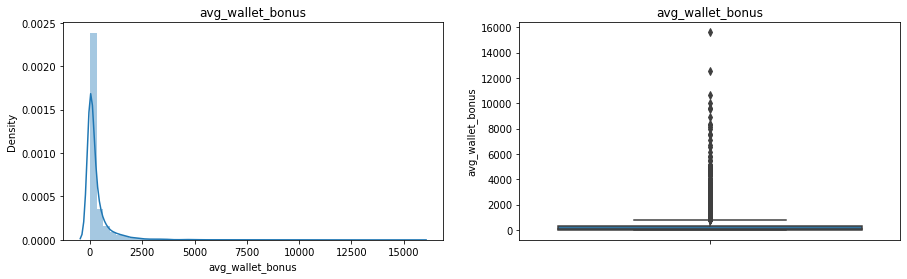

c:\users\niyazahmed\appdata\local\programs\python\python36\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


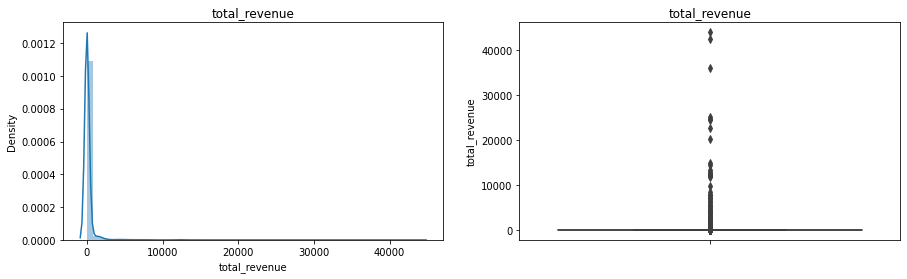

c:\users\niyazahmed\appdata\local\programs\python\python36\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


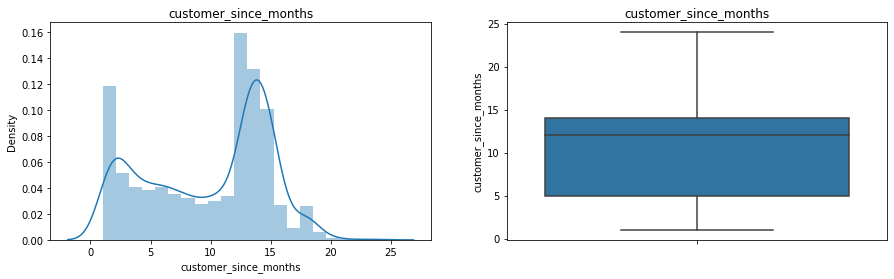

c:\users\niyazahmed\appdata\local\programs\python\python36\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


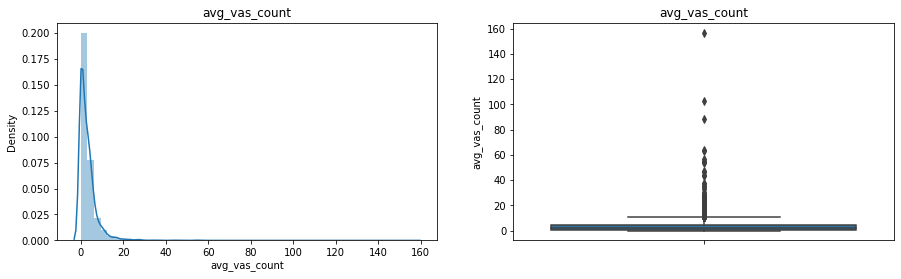

c:\users\niyazahmed\appdata\local\programs\python\python36\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


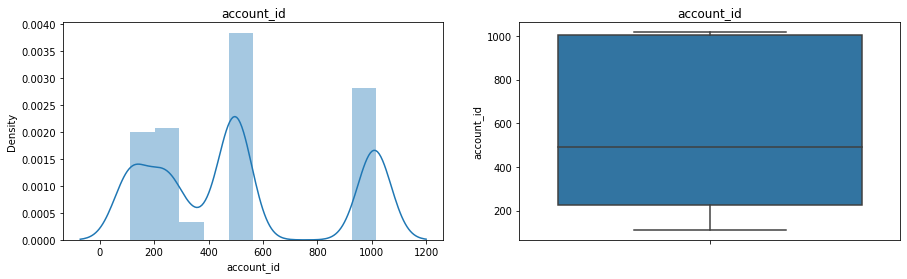

c:\users\niyazahmed\appdata\local\programs\python\python36\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


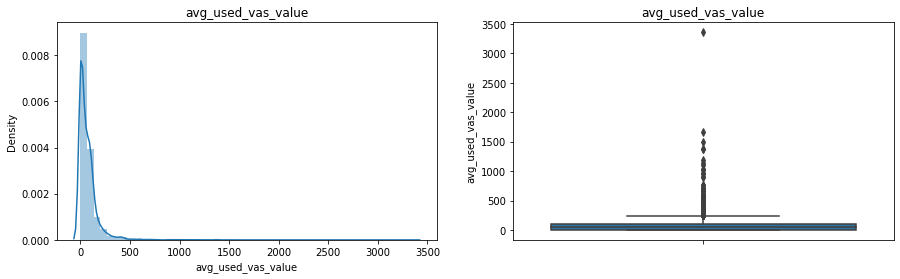

c:\users\niyazahmed\appdata\local\programs\python\python36\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


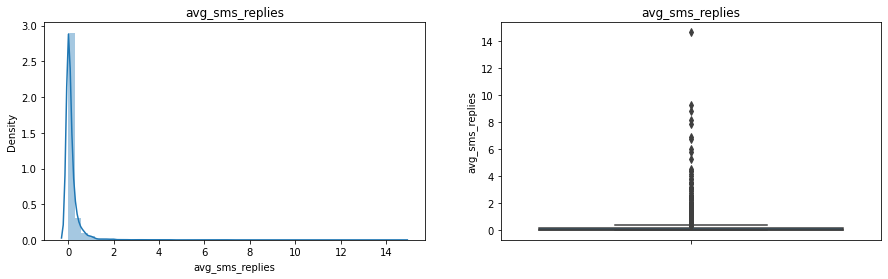

c:\users\niyazahmed\appdata\local\programs\python\python36\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


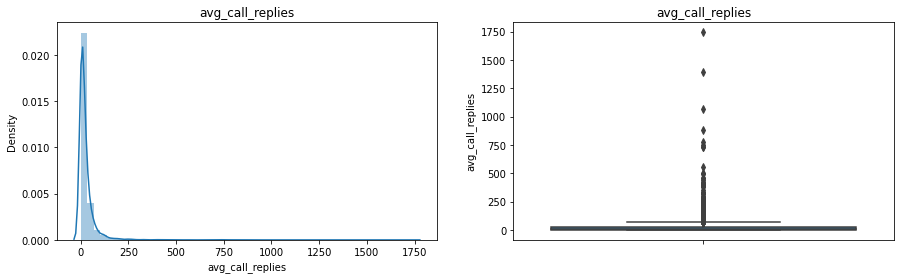

c:\users\niyazahmed\appdata\local\programs\python\python36\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


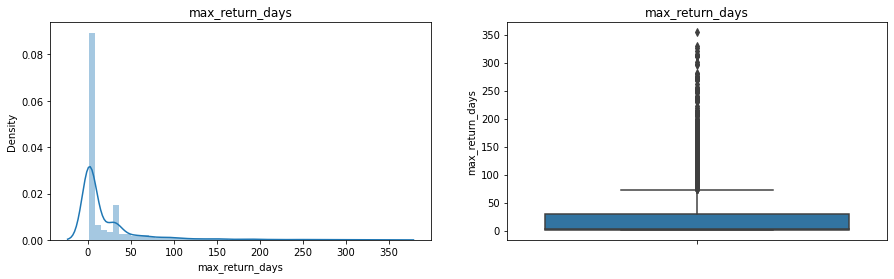

c:\users\niyazahmed\appdata\local\programs\python\python36\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


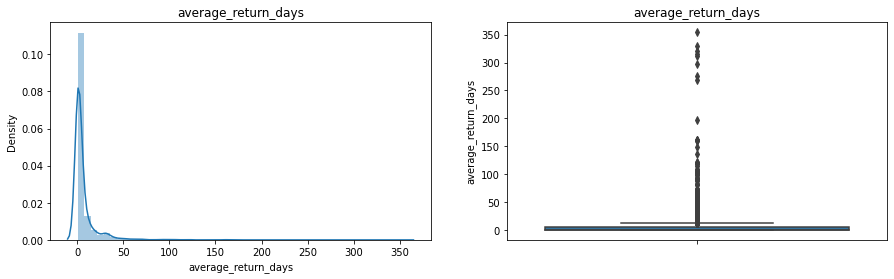

c:\users\niyazahmed\appdata\local\programs\python\python36\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


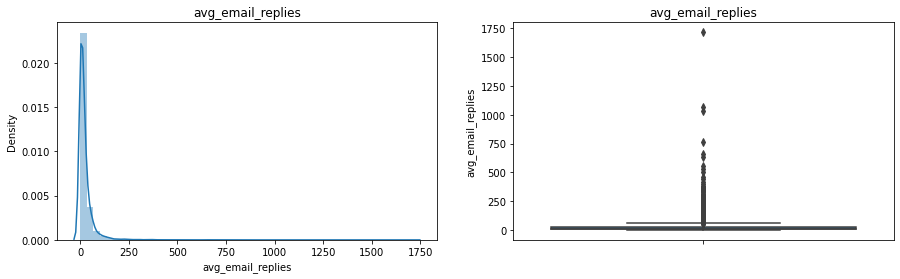

In [16]:
graph_col=set(df.columns)-set(['target'])
graph(graph_col,df)

## From the graph analyses we infer that there are lot of outliers.
## Here ZScore test is used by taking 2.5 Standard Devatation

In [17]:
def outliers(outiler_col,df):
    dff=df.copy()
    for i in outiler_col:
        z = np.abs(stats.zscore(dff[i]))
        dff = dff[(z <2.5)]
    return dff

In [18]:
df1=outliers(graph_col,df)

In [19]:
df1

,account_id,max_return_days,average_return_days,customer_since_months,total_revenue,avg_vas_count,avg_used_vas_value,avg_wallet_bonus,avg_email_replies,avg_call_replies,avg_sms_replies,target
0,496.0,8,1.500000,14,0.00,3.666667,66.666667,300.0,32.416667,27.916667,0.250000,0
1,499.0,37,8.200000,10,0.00,4.900000,114.000000,0.0,16.200000,13.800000,0.000000,0
2,493.0,9,1.533333,15,0.00,5.333333,106.666667,150.0,20.250000,24.500000,0.000000,0
4,496.0,1,1.000000,18,0.00,5.846154,109.230769,41.5,17.461538,25.769231,0.230769,0
6,1005.0,21,4.636364,11,0.00,1.000000,26.363636,0.0,46.000000,57.272727,0.181818,0
...,...,...,...,...,...,...,...,...,...,...,...,...
4402,113.0,1,1.000000,4,0.00,0.000000,0.000000,0.0,9.666667,14.666667,0.333333,0
4403,1017.0,1,1.000000,2,0.00,0.000000,0.000000,0.0,9.000000,11.500000,0.000000,0
4404,226.0,1,1.000000,2,0.00,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0
4405,226.0,1,1.000000,2,551.19,7.000000,70.000000,0.0,10.000000,8.000000,0.000000,0


c:\users\niyazahmed\appdata\local\programs\python\python36\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


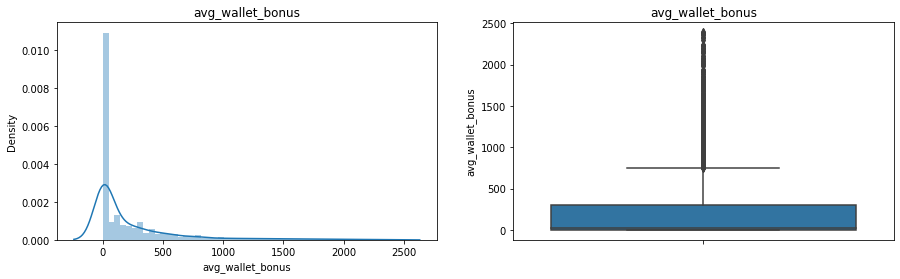

c:\users\niyazahmed\appdata\local\programs\python\python36\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


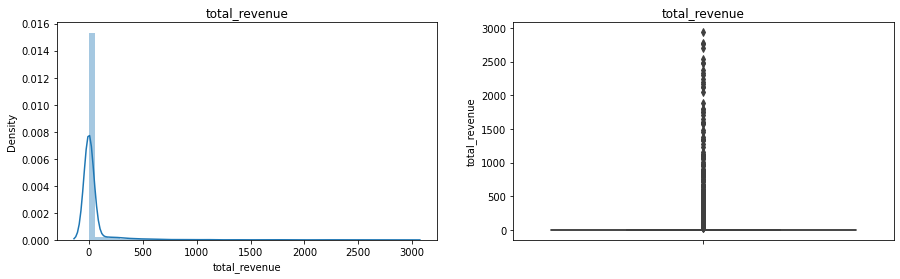

c:\users\niyazahmed\appdata\local\programs\python\python36\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


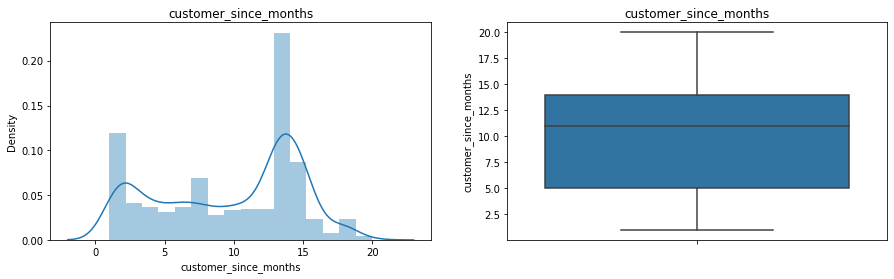

c:\users\niyazahmed\appdata\local\programs\python\python36\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


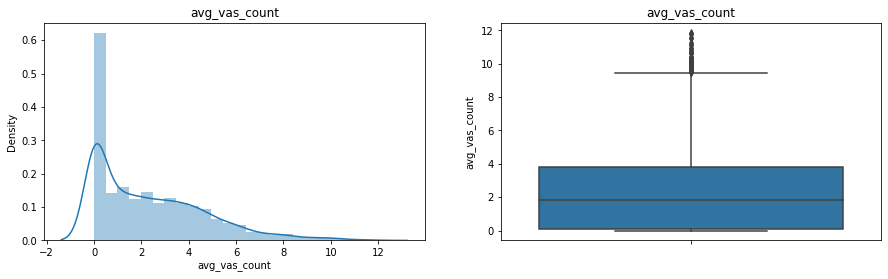

c:\users\niyazahmed\appdata\local\programs\python\python36\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


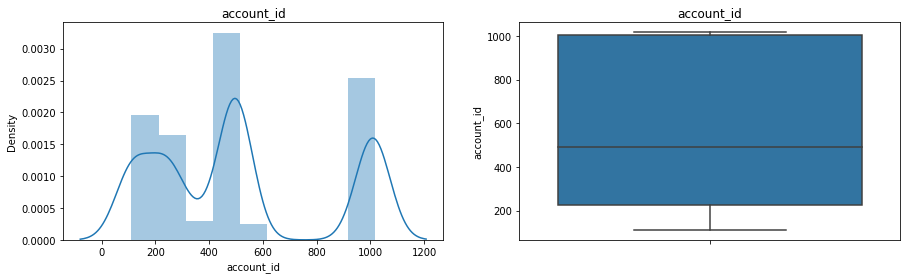

c:\users\niyazahmed\appdata\local\programs\python\python36\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


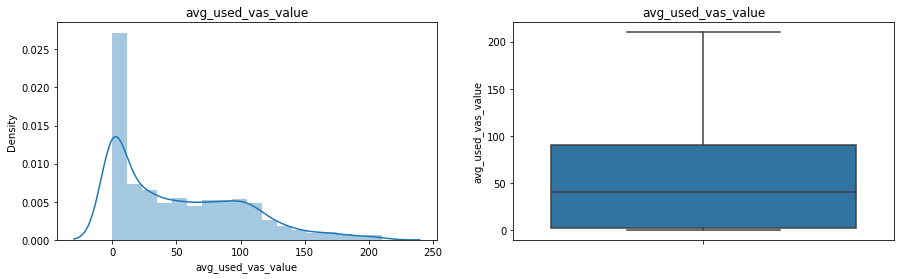

c:\users\niyazahmed\appdata\local\programs\python\python36\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


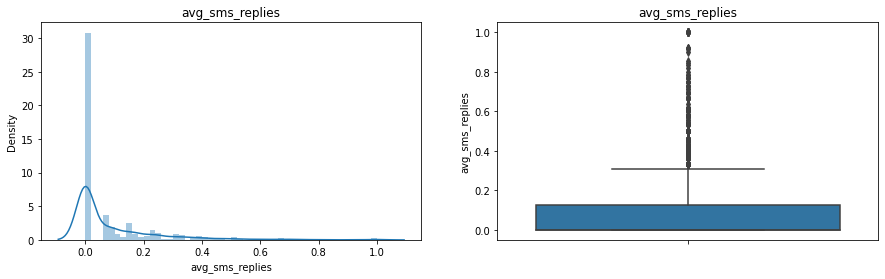

c:\users\niyazahmed\appdata\local\programs\python\python36\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


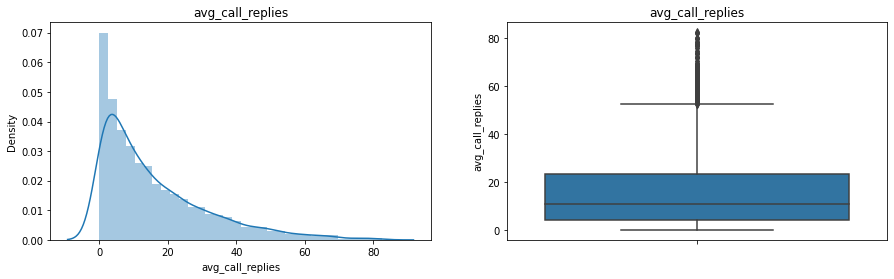

c:\users\niyazahmed\appdata\local\programs\python\python36\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


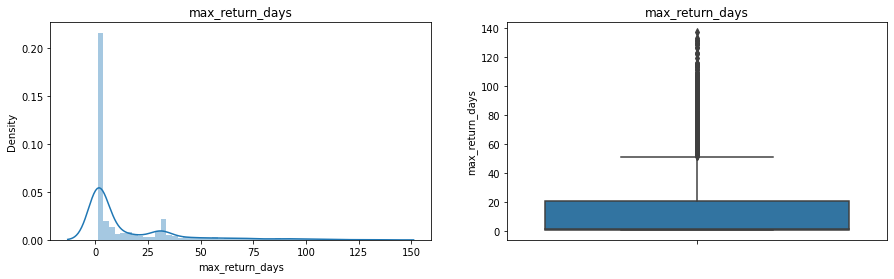

c:\users\niyazahmed\appdata\local\programs\python\python36\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


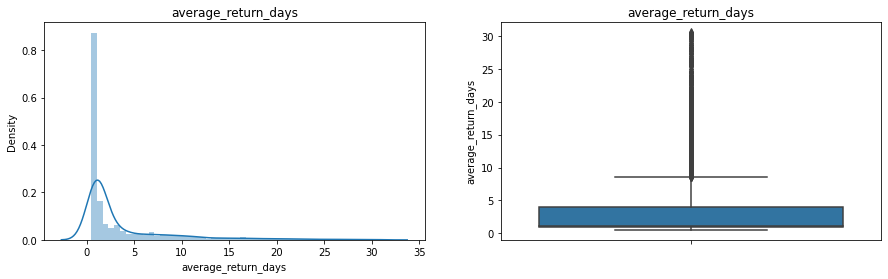

c:\users\niyazahmed\appdata\local\programs\python\python36\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


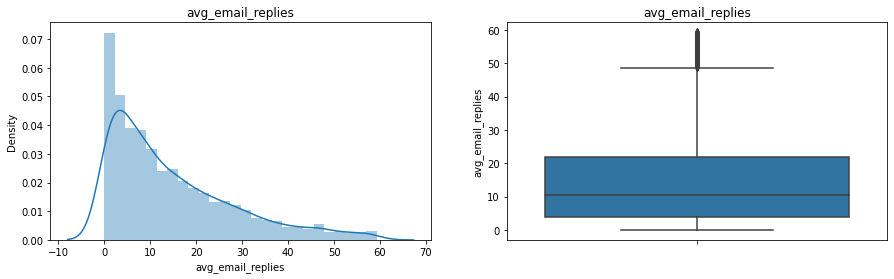

In [21]:
graph(graph_col,df1)

## There are few columns which are right skewed so they can be removed by log transformation
## Here there are some 0 values so need to use adjusted log transformation

In [22]:
def adjusted_log(columns,df):
    dff=df.copy()
    for column in columns: 
        
        dff[column]=dff[column].map(lambda X:float(np.log10(X-(min(dff[column])-1))))
    return dff

In [24]:
log_columns=set(graph_col)-set(['account_id','total_revenue','customer_since_months','avg_vas_count','max_return_days','avg_used_vas_value'])
df2=adjusted_log(log_columns,df1)

In [25]:
df2

,account_id,max_return_days,average_return_days,customer_since_months,total_revenue,avg_vas_count,avg_used_vas_value,avg_wallet_bonus,avg_email_replies,avg_call_replies,avg_sms_replies,target
0,496.0,8,0.301030,14,0.00,3.666667,66.666667,2.478566,1.523963,1.461148,0.096910,0
1,499.0,37,0.939519,10,0.00,4.900000,114.000000,0.000000,1.235528,1.170262,0.000000,0
2,493.0,9,0.308209,15,0.00,5.333333,106.666667,2.178977,1.327359,1.406540,0.000000,0
4,496.0,1,0.176091,18,0.00,5.846154,109.230769,1.628389,1.266268,1.427636,0.090177,0
6,1005.0,21,0.710656,11,0.00,1.000000,26.363636,0.000000,1.672098,1.765465,0.072551,0
...,...,...,...,...,...,...,...,...,...,...,...,...
4402,113.0,1,0.176091,4,0.00,0.000000,0.000000,0.000000,1.028029,1.194977,0.124939,0
4403,1017.0,1,0.176091,2,0.00,0.000000,0.000000,0.000000,1.000000,1.096910,0.000000,0
4404,226.0,1,0.176091,2,0.00,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0
4405,226.0,1,0.176091,2,551.19,7.000000,70.000000,0.000000,1.041393,0.954243,0.000000,0


c:\users\niyazahmed\appdata\local\programs\python\python36\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


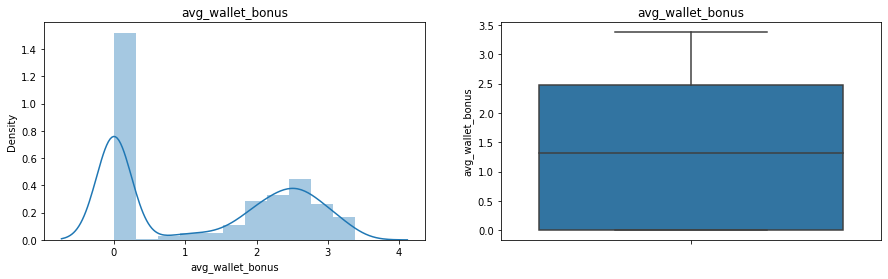

c:\users\niyazahmed\appdata\local\programs\python\python36\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


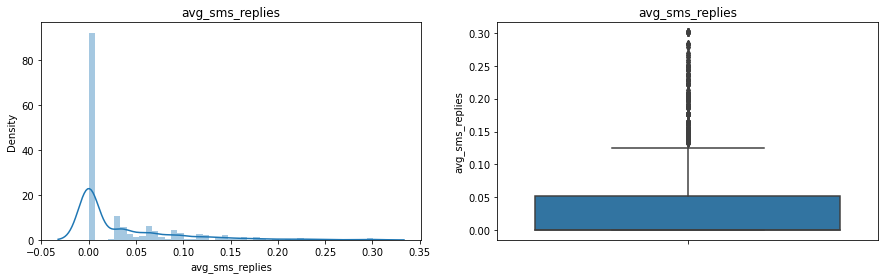

c:\users\niyazahmed\appdata\local\programs\python\python36\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


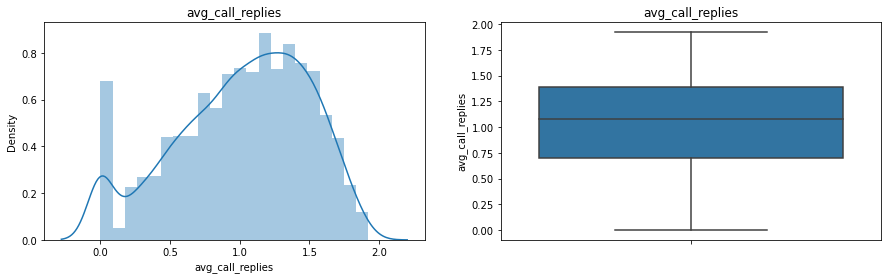

c:\users\niyazahmed\appdata\local\programs\python\python36\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


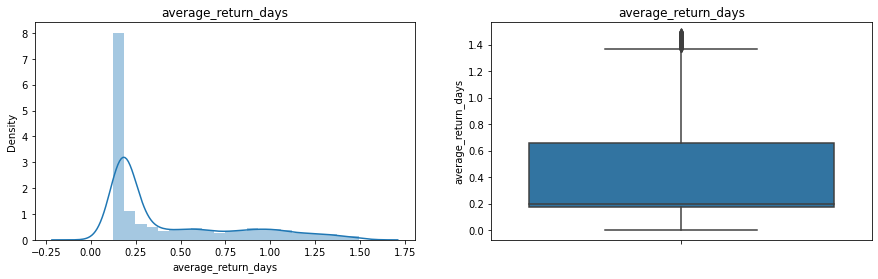

c:\users\niyazahmed\appdata\local\programs\python\python36\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


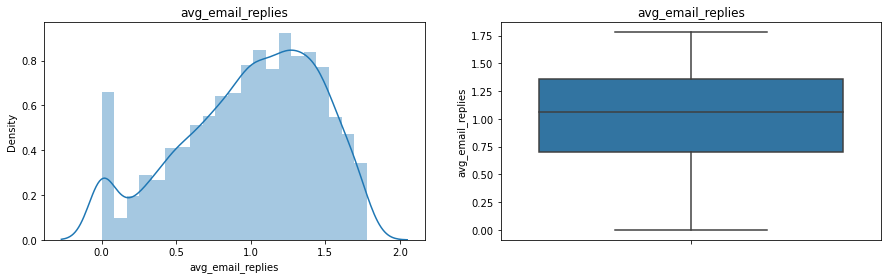

In [26]:
graph(log_columns,df2)

In [27]:
Y=df2.pop('target')

## Split the 20% of data for the testing purpose

In [28]:
X=df2.copy()
X_train,X_test,y_train,y_test=train_test_split(X,Y,test_size=0.2)

### Since  there are some outliers and magnitude is too high so Standardise the data

In [29]:
Standardation=StandardScaler()

In [30]:
X_train=Standardation.fit_transform(X_train)

In [31]:
X_test=Standardation.transform(X_test)

In [32]:
X_test=pd.DataFrame(X_test,columns=df2.columns)

In [33]:
X_train=pd.DataFrame(X_train,columns=df2.columns)

## Check for multicolinerarity if any.

In [34]:
def checkVIF(X):
    vif = pd.DataFrame()
    vif['Features'] = X.columns
    vif['VIF'] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]
    vif['VIF'] = round(vif['VIF'], 2)
    vif = vif.sort_values(by = "VIF", ascending = False)
    return(vif)

In [35]:
checkVIF(X_train)

,Features,VIF
8,avg_email_replies,11.04
9,avg_call_replies,10.96
6,avg_used_vas_value,8.79
5,avg_vas_count,8.02
2,average_return_days,3.60
1,max_return_days,3.53
3,customer_since_months,2.52
7,avg_wallet_bonus,1.92
10,avg_sms_replies,1.29
4,total_revenue,1.10


### Drop the columns who's VIF value is more than 5 each at a time.

In [36]:
X_train.drop(['avg_call_replies'],axis=1,inplace=True)

In [37]:
checkVIF(X_train)

,Features,VIF
6,avg_used_vas_value,8.79
5,avg_vas_count,8.02
2,average_return_days,3.60
1,max_return_days,3.53
3,customer_since_months,2.50
7,avg_wallet_bonus,1.92
8,avg_email_replies,1.85
9,avg_sms_replies,1.28
4,total_revenue,1.10
0,account_id,1.05


In [38]:
X_train.drop(['avg_used_vas_value'],axis=1,inplace=True)

In [39]:
checkVIF(X_train)

,Features,VIF
2,average_return_days,3.59
1,max_return_days,3.53
3,customer_since_months,2.46
6,avg_wallet_bonus,1.92
7,avg_email_replies,1.84
5,avg_vas_count,1.52
8,avg_sms_replies,1.28
4,total_revenue,1.07
0,account_id,1.04


In [40]:
X_test.drop(['avg_used_vas_value','avg_call_replies'],axis=1,inplace=True)

c:\users\niyazahmed\appdata\local\programs\python\python36\lib\site-packages\seaborn\_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


<AxesSubplot:xlabel='target', ylabel='count'>

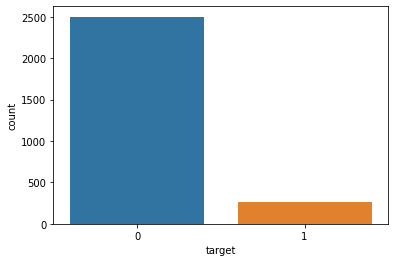

In [41]:
sns.countplot(y_train)

## The data is highly imbalanced so there will be problem to get the right accuracy

In [42]:
pipe=make_pipeline(SMOTE(),LogisticRegression())
pipe.get_params().keys()

dict_keys(['memory', 'steps', 'verbose', 'smote', 'logisticregression', 'smote__k_neighbors', 'smote__n_jobs', 'smote__random_state', 'smote__sampling_strategy', 'logisticregression__C', 'logisticregression__class_weight', 'logisticregression__dual', 'logisticregression__fit_intercept', 'logisticregression__intercept_scaling', 'logisticregression__l1_ratio', 'logisticregression__max_iter', 'logisticregression__multi_class', 'logisticregression__n_jobs', 'logisticregression__penalty', 'logisticregression__random_state', 'logisticregression__solver', 'logisticregression__tol', 'logisticregression__verbose', 'logisticregression__warm_start'])

### Applying the SMOTE because the data is highly imbalanced.

# 1.Logistic Regression

In [43]:
weights=np.linspace(0.5, 0.95, 50)
gsc=GridSearchCV(
        estimator=pipe,
        param_grid={'smote__sampling_strategy':weights,
                   'logisticregression__C':[1,10,100],
                    'logisticregression__solver':['liblinear','lbfgs']
                   },
    scoring='f1',
    cv=4)
grid_res=gsc.fit(X_train,y_train)

In [44]:
gsc.best_params_

{'logisticregression__C': 1,
 'logisticregression__solver': 'liblinear',
 'smote__sampling_strategy': 0.8122448979591836}

In [45]:
over=SMOTE(sampling_strategy= 0.8122448979591836)
X_train,y_train=over.fit_resample(X_train,y_train)

In [46]:
model=LogisticRegression(C=1,solver='liblinear')
model.fit(X_train, y_train)

LogisticRegression(C=1, solver='liblinear')

In [47]:
y_pred=model.predict(X_test)

In [48]:
from sklearn.metrics import confusion_matrix

In [49]:
confusion_matrix(y_test,y_pred)

array([[434, 202],
       [ 21,  36]], dtype=int64)

In [50]:
y_pred_proba=model.predict_proba(X_test)

### Let's assume the data is balanced and apply auc_roc curve to get the right threshold for classification

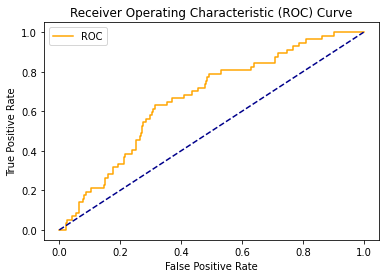

In [52]:

y_pred_proba_1=pd.Series(y_pred_proba[:,1])
fpr, tpr, thresholds = roc_curve(y_test, y_pred_proba_1)

def plot_roc_curve(fpr, tpr):
    plt.plot(fpr, tpr, color='orange', label='ROC')
    plt.plot([0, 1], [0, 1], color='darkblue', linestyle='--')
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('Receiver Operating Characteristic (ROC) Curve')
    plt.legend()
    plt.show()
plot_roc_curve(fpr, tpr)

In [53]:
accuracy_ls = []
for thres in thresholds:
    y_pred_2 = np.where(y_pred_proba_1>thres,1,0)
    accuracy_ls.append(accuracy_score(y_test, y_pred_2, normalize=True))
    
accuracy_ls = pd.concat([pd.Series(thresholds), pd.Series(accuracy_ls)],
                        axis=1)
accuracy_ls.columns = ['thresholds', 'accuracy']
accuracy_ls.sort_values(by='accuracy', ascending=False, inplace=True)

In [54]:
accuracy_ls

,thresholds,accuracy
0,1.830531,0.917749
1,0.830531,0.917749
2,0.826867,0.916306
3,0.825506,0.914863
4,0.805415,0.907648
...,...,...
110,0.117585,0.207792
111,0.117078,0.206349
112,0.105568,0.170274
113,0.104196,0.168831


In [55]:
a=0.830531
y_pred_2 = np.where(y_pred_proba_1>a,1,0)

In [56]:
confusion_matrix(y_pred_2,y_test)

array([[636,  57],
       [  0,   0]], dtype=int64)

### This result infer that the data is highly biased to 0 

# 2.Deep Neural Network(ANN)

In [57]:
classifier = Sequential()
classifier.add(Dense(units = 6, kernel_initializer = 'he_uniform',activation='relu',input_dim =9))
classifier.add(Dense(units = 6, kernel_initializer = 'he_uniform',activation='relu'))
classifier.add(Dense(units = 8, kernel_initializer = 'he_uniform',activation='relu'))
classifier.add(Dense(units = 6, kernel_initializer = 'he_uniform',activation='relu'))
classifier.add(Dense(units = 1, kernel_initializer = 'glorot_uniform', activation = 'sigmoid'))
classifier.compile(optimizer = 'Adamax', loss = 'binary_crossentropy', metrics = ['accuracy'])
model_history=classifier.fit(X_train, y_train,validation_split=0.2, batch_size = 10, epochs = 200,class_weight={0:0.30,1:0.70},callbacks=[EarlyStopping(monitor='val_loss',patience=20)])

Epoch 1/200
363/363 [==============================] - 1s 4ms/step - loss: 0.3363 - accuracy: 0.5451 - val_loss: 0.8621 - val_accuracy: 0.4498
Epoch 2/200
363/363 [==============================] - 1s 2ms/step - loss: 0.2962 - accuracy: 0.5388 - val_loss: 0.7280 - val_accuracy: 0.6670
Epoch 3/200
363/363 [==============================] - 1s 2ms/step - loss: 0.2848 - accuracy: 0.5374 - val_loss: 0.6767 - val_accuracy: 0.7155
Epoch 4/200
363/363 [==============================] - 1s 2ms/step - loss: 0.2770 - accuracy: 0.5619 - val_loss: 0.6557 - val_accuracy: 0.7431
Epoch 5/200
363/363 [==============================] - 1s 2ms/step - loss: 0.2695 - accuracy: 0.6052 - val_loss: 0.6374 - val_accuracy: 0.7541
Epoch 6/200
363/363 [==============================] - 1s 2ms/step - loss: 0.2634 - accuracy: 0.6237 - val_loss: 0.6285 - val_accuracy: 0.7607
Epoch 7/200
363/363 [==============================] - 1s 2ms/step - loss: 0.2588 - accuracy: 0.6361 - val_loss: 0.6129 - val_accuracy: 0.7740

Epoch 58/200
363/363 [==============================] - 1s 3ms/step - loss: 0.2129 - accuracy: 0.7186 - val_loss: 0.4414 - val_accuracy: 0.8467
Epoch 59/200
363/363 [==============================] - 1s 2ms/step - loss: 0.2124 - accuracy: 0.7175 - val_loss: 0.4605 - val_accuracy: 0.8412
Epoch 60/200
363/363 [==============================] - 1s 2ms/step - loss: 0.2119 - accuracy: 0.7175 - val_loss: 0.4743 - val_accuracy: 0.8379
Epoch 61/200
363/363 [==============================] - 1s 2ms/step - loss: 0.2114 - accuracy: 0.7214 - val_loss: 0.4631 - val_accuracy: 0.8434
Epoch 62/200
363/363 [==============================] - 1s 3ms/step - loss: 0.2109 - accuracy: 0.7197 - val_loss: 0.4725 - val_accuracy: 0.8401
Epoch 63/200
363/363 [==============================] - 1s 2ms/step - loss: 0.2104 - accuracy: 0.7211 - val_loss: 0.4742 - val_accuracy: 0.8379
Epoch 64/200
363/363 [==============================] - 1s 2ms/step - loss: 0.2099 - accuracy: 0.7211 - val_loss: 0.4550 - val_accuracy:

## Here too we need to get the right threshold because it returns sofmax value which range between 0-1

In [58]:
y_pred = classifier.predict(X_test)
ratio=np.linspace(0.5,0.8,20)
for i in ratio:
    
    y_pred_1 = (y_pred >i)
    cm = confusion_matrix(y_test, y_pred_1)
    print(cm)
    score=accuracy_score(y_pred_1,y_test)
    print(score)
    print('-----------------------------------------------')


[[409 227]
 [ 20  37]]
0.6435786435786436
-----------------------------------------------
[[415 221]
 [ 20  37]]
0.6522366522366523
-----------------------------------------------
[[422 214]
 [ 21  36]]
0.6608946608946609
-----------------------------------------------
[[427 209]
 [ 21  36]]
0.6681096681096681
-----------------------------------------------
[[430 206]
 [ 21  36]]
0.6724386724386724
-----------------------------------------------
[[435 201]
 [ 22  35]]
0.6782106782106783
-----------------------------------------------
[[440 196]
 [ 22  35]]
0.6854256854256854
-----------------------------------------------
[[443 193]
 [ 22  35]]
0.6897546897546898
-----------------------------------------------
[[447 189]
 [ 22  35]]
0.6955266955266955
-----------------------------------------------
[[461 175]
 [ 25  32]]
0.7113997113997114
-----------------------------------------------
[[467 169]
 [ 25  32]]
0.7200577200577201
-----------------------------------------------
[[477 159]

### ANN does pritty good compare to logistic regression

In [59]:
from sklearn import tree

In [60]:
X=df2.copy()
X_train,X_test,y_train,y_test=train_test_split(X,Y,test_size=0.2)

# 3.DecisionTreeClassifier

In [61]:

pca = decomposition.PCA()

    # Creating a DecisionTreeClassifier
dec_tree = tree.DecisionTreeClassifier()

# Creating a pipeline of three steps. First, standardizing the data.
# Second, tranforming the data with PCA.
# Third, training a Decision Tree Classifier on the data.
pipe = Pipeline(steps=[('pca', pca),
                       ('dec_tree', dec_tree)])

# Creating Parameter Space
# Creating a list of a sequence of integers from 1 to 30 (the number of features in X + 1)
n_components = list(range(1,X_train.shape[1]+1,1))

# Creating lists of parameter for Decision Tree Classifier
criterion = ['gini', 'entropy']
max_depth = [2,4,6,8,10,12]

# Creating a dictionary of all the parameter options 
# Note that we can access the parameters of steps of a pipeline by using '__’
parameters = dict(pca__n_components=n_components,
                  dec_tree__criterion=criterion,
                  dec_tree__max_depth=max_depth)

# Conducting Parameter Optmization With Pipeline
# Creating a grid search object
clf_GS = GridSearchCV(pipe, parameters)

# Fitting the grid search
clf_GS.fit(X_train, y_train)


c:\users\niyazahmed\appdata\local\programs\python\python36\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\users\niyazahmed\appdata\local\programs\python\python36\lib\site-packages\sklearn\model_selection\_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "c:\users\niyazahmed\appdata\local\programs\python\python36\lib\site-packages\sklearn\pipeline.py", line 330, in fit
    Xt = self._fit(X, y, **fit_params_steps)
  File "c:\users\niyazahmed\appdata\local\programs\python\python36\lib\site-packages\sklearn\pipeline.py", line 296, in _fit
    **fit_params_steps[name])
  File "c:\users\niyazahmed\appdata\local\programs\python\python36\lib\site-packages\joblib\memory.py", line 352, in __call__
    return self.func(*args, **kwargs)
  File "c:\users\niyaz

GridSearchCV(estimator=Pipeline(steps=[('pca', PCA()),
                                       ('dec_tree', DecisionTreeClassifier())]),
             param_grid={'dec_tree__criterion': ['gini', 'entropy'],
                         'dec_tree__max_depth': [2, 4, 6, 8, 10, 12],
                         'pca__n_components': [1, 2, 3, 4, 5, 6, 7, 8, 9, 10,
                                               11]})

In [62]:
clf_GS.best_params_

{'dec_tree__criterion': 'gini',
 'dec_tree__max_depth': 2,
 'pca__n_components': 4}

In [63]:
pred=clf_GS.predict(X_test)

In [64]:
confusion_matrix(pred,y_test)

array([[637,  56],
       [  0,   0]], dtype=int64)

### DecisionTreeClassifier did the same thing as of LogisticRegression

# 4.RandomForestClassifier

In [65]:

rfc = RandomForestClassifier(n_jobs=-1,max_features= 'sqrt' ,n_estimators=50, oob_score = True) 

param_grid = { 
    'n_estimators': [100,200,400,550,700],
    'max_features': ['auto', 'sqrt', 'log2']
}

CV_rfc = GridSearchCV(estimator=rfc, param_grid=param_grid, cv= 5)
CV_rfc.fit(X_train, y_train)
print (CV_rfc.best_params_)

{'max_features': 'log2', 'n_estimators': 700}


In [66]:
pred=CV_rfc.predict(X_test)
print(confusion_matrix(pred,y_test))
print(accuracy_score(y_test,pred))

[[635  47]
 [  2   9]]
0.9292929292929293


## RandomForestClassifier goes better compare all the above Classifiers and ANN

# 5.AdaBoostRegressor

In [69]:
from sklearn.ensemble import AdaBoostClassifier
param_dist = {
 'n_estimators': [50, 100],
 }
pre_gs_inst = GridSearchCV(AdaBoostClassifier(),
 param_grid = param_dist,
 cv=3, 
 n_jobs=-1)
pre_gs_inst.fit(X_train, y_train)

GridSearchCV(cv=3, estimator=AdaBoostClassifier(), n_jobs=-1,
             param_grid={'n_estimators': [50, 100]})

In [70]:
pred=pre_gs_inst.predict(X_test)
pred = np.where(pred>0.5,1,0)
print(confusion_matrix(pred,y_test))
print(accuracy_score(y_test,pred))

[[635  55]
 [  2   1]]
0.9177489177489178


# 6.GradientBoostingClassifier

In [71]:

parameters = {
    
    "learning_rate": [0.01, 0.025, 0.075, 0.15],
    
    "max_depth":[3,8],
    "max_features":["log2","sqrt"],
    
    "n_estimators":[10]
    }

clf = GridSearchCV(GradientBoostingClassifier(), parameters, cv=10, n_jobs=-1)

clf.fit(X_train,y_train)

GridSearchCV(cv=10, estimator=GradientBoostingClassifier(), n_jobs=-1,
             param_grid={'learning_rate': [0.01, 0.025, 0.075, 0.15],
                         'max_depth': [3, 8], 'max_features': ['log2', 'sqrt'],
                         'n_estimators': [10]})

In [72]:
pred=clf.predict(X_test)
print(confusion_matrix(pred,y_test))
print(accuracy_score(y_test,pred))

[[630  53]
 [  7   3]]
0.9134199134199135


## Overall from all the classifiers RandomForest fulfil the requirement 
### But the drawback here is the data which is highly unbalanced 
#### So it got difficult to get the right prediction

### Hope I have done my job waiting for your positive responce